Indicadores de salud
SP.DYN.LE00.IN (Esperanza de vida al nacer): Promedio de años que se espera que viva un recién nacido, si los patrones de mortalidad por edad específicos actuales continúan sin cambios.
SH.XPD.CHEX.GD.ZS (Gasto en salud (% del PIB)): Gasto total en salud como porcentaje del producto interno bruto.
SH.XPD.CHEX.PC.CD (Gasto en salud per cápita): Gasto corriente total en salud por persona en dólares estadounidenses.
SH.DYN.MORT (Mortalidad infantil): Número de niños menores de un año que mueren por cada 1,000 nacidos vivos.
SH.STA.BRTC.ZS (Nacimientos atendidos por personal de salud (%)): Porcentaje de nacimientos que son atendidos por personal de salud capacitado.
SH.MED.PHYS.ZS (Médicos por cada 1,000 habitantes): Número de médicos (por lo general, médicos) por cada 1,000 personas.
Indicadores económicos
NY.GDP.MKTP.KD.ZG (Crecimiento del PIB (%)): Tasa de crecimiento anual del producto interno bruto real.
NY.GDP.PCAP.CD (PIB per cápita): Producto interno bruto dividido por la población.
Indicadores sociales
SI.POV.DDAY (% de la población bajo la línea de pobreza ($2.15/día)): Porcentaje de la población que vive con menos de $2.15 al día en dólares internacionales de 2011, utilizando la paridad del poder adquisitivo.
SE.ADT.LITR.ZS (Tasa de alfabetización): Porcentaje de personas de 15 años o más que pueden leer y escribir, con comprensión, una declaración breve y sencilla sobre su vida cotidiana.
SL.UEM.TOTL.ZS (Desempleo total (%)): Porcentaje de la población activa total que está desempleada, pero disponible para trabajar y buscando trabajo activamente.



In [91]:
import requests
import json
import pandas as pd  # Importa pandas para crear DataFrames

indicadores = [
    "SP.DYN.LE00.IN",  # Esperanza de vida al nacer
    "SH.XPD.CHEX.GD.ZS",  # Gasto en salud (% del PIB)
    "SH.XPD.CHEX.PC.CD",  # Gasto en salud per cápita
    "SH.DYN.MORT",  # Mortalidad infantil
    "SH.STA.BRTC.ZS",  # Nacimientos atendidos por personal de salud (%)
    "SH.MED.PHYS.ZS",  # Médicos por cada 1,000 habitantes
    "NY.GDP.MKTP.KD.ZG",  # Crecimiento del PIB (%)
    "NY.GDP.PCAP.CD",  # PIB per cápita
    "SI.POV.DDAY",  # % de la población bajo la línea de pobreza ($2.15/día)
    "SE.ADT.LITR.ZS",  # Tasa de alfabetización
    "SL.UEM.TOTL.ZS",  # Desempleo total (%)
    "SL.UEM.TOTL.NE.ZS", #Unemployment refers to the share of the labor force that is without work but available for and seeking employment. Definitions of labor force and unemployment differ by country.
    "SH.STA.BASS.ZS", #People using at least basic sanitation services (% of population)
    "SI.POV.NAHC", #National poverty headcount ratio is the percentage of the population living below the national poverty line(s).
    "SN.ITK.SVFI.ZS", #The percentage of people in the population who live in households classified as severely food insecure. A household is classified as severely food insecure when at least one adult in the household has reported to have been exposed, at times during the year, to several of the most severe experiences described in the FIES questions, such as to have been forced to reduce the quantity of the food, to have skipped meals, having gone hungry, or having to go for a whole day without eating because of a lack of money or other resources.
    "PNUD.IDH.XD", #Indice de desarrollo humando
    "SH.STA.SANI.ZS", #Acceso a saneamiento:"
    "SH.HIV.TOTL.ZS", #VIH
    "SH.IMM.MEAS", #Tasa de vacunación infantil (Sarampión):
    "SP.DYN.CBRT.IN",#Tasa de natalidad: 
    "SP.DYN.CDRT.IN"#Tasa de mortalidad: 
]
paises =  [ "ARG", "BRA", "MEX", "ESP", "DEU", "USA", "CHN", "IND", "COL", "PER", "CHL", "VEN", "FRA", "ITA",
    "GBR", "CAN", "JPN", "AUS", "RUS", "ZAF", "EGY", "IDN", "TUR", "KOR", "SAU", "THA", "UKR", "PAK",
    "IRN", "PHL", "VNM", "NGA", "POL", "NLD", "SWE", "BEL", "CHE", "AUT", "ISR", "NOR", "FIN", "DNK",
    "SGP", "MYS", "NZL", "HKG", "GRC", "HUN", "ROU", "CZE", "PRT", "IRL", "BGR", "SVK",
    "AFG", "ALB", "DZA", "ASM", "AND", "AGO", "ATG", "AZE", "BHS", "BHR", "BGD", "BRB",
    "BLR", "BLZ", "BEN", "BMU", "BTN", "BOL", "BIH", "BWA", "BRN", "BFA", "BDI", "CPV", "KHM",
    "CMR", "CAF", "CYM", "COD", "COG", "COM", "CRI", "CIV", "HRV", "CUB", "CUW", "CYP", "DJI", "DMA",
    "DOM", "ECU", "SLV", "ERI", "EST", "SWZ", "ETH", "FRO", "FJI", "GAB", "GMB", "GEO", "GHA",
    "GIB", "GNB", "GRD", "GTM", "GIN", "GUY", "HTI", "HND", "ISL", "JAM", "JOR", "KEN", "KIR", "KWT",
    "KGZ", "LAO", "LVA", "LBN", "LSO", "LBR", "LBY", "LIE", "LTU", "LUX", "MDV", "MLI", "MLT", "MHL",
    "MRT", "MUS", "FSM", "MDA", "MCO", "MNG", "MNE", "MAR", "MOZ", "MMR", "NAM", "NRU", "NPL", "NIC",
    "NER", "MKD", "MNP", "OMN", "PAN", "PNG", "PRY", "QAT", "SRB", "RWA", "LCA",
    "VCT", "WSM", "SMR", "STP", "SEN", "SYC", "SLE", "SLV", "SOM", "SSD", "LKA", "SDN", "SUR", "SYR",
    "TJK", "TZA", "TLS", "TGO", "TON", "TTO", "TUN", "TKM", "TCA", "TUV", "UGA", "URY", "UZB", "VUT",
    "VIR", "YEM", "ZMB", "ZWE" ] # Lista de países

datos_todos_indicadores = []  # Lista para almacenar los datos de todos los indicadores

for indicador in indicadores:
    for pais in paises:  # Itera sobre la lista de países
        url = f"https://api.worldbank.org/v2/country/{pais}/indicator/{indicador}?format=json&date=2000:2025"
        try:
            response = requests.get(url)
            response.raise_for_status()  # Lanza una excepción para códigos de error HTTP
            datos = response.json()

            # Extrae los datos relevantes del JSON y guárdalos en un diccionario
            if datos and len(datos) > 1:  # Verifica si hay datos
                datos_indicador = datos[1]  # Los datos están en el segundo elemento de la lista
                for item in datos_indicador:
                  if item.get('value') is not None: # Verifica que el valor no sea nulo
                    datos_todos_indicadores.append({
                        'pais': pais,
                        'indicador': indicador,
                        'anio': item['date'],
                        'valor': item['value']
                    })
            else:
                print(f"No se encontraron datos para el indicador {indicador} en el país {pais}.")

        except requests.exceptions.RequestException as e:
            print(f"Error al consultar la API para el indicador {indicador} en el país {pais}: {e}")
        except (json.JSONDecodeError, IndexError) as e:
            print(f"Error al procesar el JSON para el indicador {indicador} en el país {pais}: {e}")
            if hasattr(response, 'text'): # Verifica si la respuesta tiene un atributo 'text'
              print(f"Texto de la respuesta: {response.text}") # Imprime el texto de la respuesta para depuración
        except Exception as e:
            print(f"Error inesperado al procesar el indicador {indicador} en el país {pais}: {e}")

# Crea un DataFrame con todos los datos
df_todos_indicadores = pd.DataFrame(datos_todos_indicadores)

# Imprime el DataFrame o guárdalo en un archivo CSV
print(df_todos_indicadores)
#df_todos_indicadores.to_csv("datos_indicadores_paises.csv", index=False)  # Guarda el DataFrame a un archivo CSV

No se encontraron datos para el indicador PNUD.IDH.XD en el país ARG.
No se encontraron datos para el indicador PNUD.IDH.XD en el país BRA.
No se encontraron datos para el indicador PNUD.IDH.XD en el país MEX.
No se encontraron datos para el indicador PNUD.IDH.XD en el país ESP.
No se encontraron datos para el indicador PNUD.IDH.XD en el país DEU.
No se encontraron datos para el indicador PNUD.IDH.XD en el país USA.
No se encontraron datos para el indicador PNUD.IDH.XD en el país CHN.
No se encontraron datos para el indicador PNUD.IDH.XD en el país IND.
No se encontraron datos para el indicador PNUD.IDH.XD en el país COL.
No se encontraron datos para el indicador PNUD.IDH.XD en el país PER.
No se encontraron datos para el indicador PNUD.IDH.XD en el país CHL.
No se encontraron datos para el indicador PNUD.IDH.XD en el país VEN.
No se encontraron datos para el indicador PNUD.IDH.XD en el país FRA.
No se encontraron datos para el indicador PNUD.IDH.XD en el país ITA.
No se encontraron da

In [7]:
df_todos_indicadores.to_csv("esperanza_vida_wb.csv", index=False)

NameError: name 'df_todos_indicadores' is not defined

### Una vez descargados los datos de la API, trabajo directamtne sobre el CSV.

In [175]:
import pandas as pd
indicadores = pd.read_csv('C:/Users/Usuario/Downloads/Data Science II/Proyecto Final/esperanza_vida_wb.csv',low_memory=False, sep=',', encoding='iso-8859-1')

indicadores

,pais,indicador,anio,valor
0,ARG,SP.DYN.LE00.IN,2022,76.064
1,ARG,SP.DYN.LE00.IN,2021,75.390
2,ARG,SP.DYN.LE00.IN,2020,75.892
3,ARG,SP.DYN.LE00.IN,2019,77.284
4,ARG,SP.DYN.LE00.IN,2018,76.999
...,...,...,...,...
58034,ZWE,SP.DYN.CDRT.IN,2004,16.989
58035,ZWE,SP.DYN.CDRT.IN,2003,17.805
58036,ZWE,SP.DYN.CDRT.IN,2002,16.953
58037,ZWE,SP.DYN.CDRT.IN,2001,19.048


In [176]:
# Define las columnas para pivotar
index_cols = ['pais', 'anio']
columns_col = 'indicador'
values_col = 'valor'

# Pivotea la tabla
df_pivot = indicadores.pivot_table(index=index_cols, columns=columns_col, values=values_col)


# Restablece el índice para que 'pais' y 'anio' sean columnas
df_pivot = df_pivot.reset_index()

# Renombro el código de cada indicador para darle una mejor lectura a los mismos.
nombres_indicadores = {
    "SP.DYN.LE00.IN": "Esperanza de vida al nacer",
    "SH.XPD.CHEX.GD.ZS": "Gasto en salud (% del PIB)",
    "SH.XPD.CHEX.PC.CD": "Gasto en salud per cápita",
    "SH.DYN.MORT": "Mortalidad infantil",
    "SH.STA.BRTC.ZS": "Nacimientos atendidos por personal de salud (%)",
    "SH.MED.PHYS.ZS": "Médicos por cada 1,000 habitantes",
    "NY.GDP.MKTP.KD.ZG": "Crecimiento del PIB (%)",
    "NY.GDP.PCAP.CD": "PIB per cápita",
    "SI.POV.DDAY": "% de la población bajo la línea de pobreza ($2.15/día)",
    "SE.ADT.LITR.ZS": "Tasa de alfabetización",
    "SL.UEM.TOTL.ZS": "Desempleo total (%)",
    "SL.UEM.TOTL.NE.ZS": "Desempleados Buscando (%)",
    "SH.STA.BASS.ZS" : "(%) de Pobalacion con Baño",
    "SI.POV.NAHC" : "Ratio de Poblacion por Debajo del NP",
    "SN.ITK.SVFI.ZS": "(%) de Poblacion que No Tiene todas las comidas",
    "SP.DYN.CBRT.IN":"Tasa de natalidad", 
    "SP.DYN.CDRT.IN": "Tasa de mortalidad",
    "SH.IMM.MEAS": "Tasa de vacunación infantil (Sarampión):"
}
df_pivot = df_pivot.rename(columns=nombres_indicadores)
# Imprime información del DataFrame
df_pivot

indicador,pais,anio,Crecimiento del PIB (%),PIB per cápita,Tasa de alfabetización,Mortalidad infantil,Tasa de vacunación infantil (Sarampión):,"Médicos por cada 1,000 habitantes",(%) de Pobalacion con Baño,Nacimientos atendidos por personal de salud (%),Gasto en salud (% del PIB),Gasto en salud per cápita,% de la población bajo la línea de pobreza ($2.15/día),Ratio de Poblacion por Debajo del NP,Desempleados Buscando (%),Desempleo total (%),(%) de Poblacion que No Tiene todas las comidas,Tasa de natalidad,Tasa de mortalidad,Esperanza de vida al nacer
0,AFG,2000,NaN,174.930991,NaN,131.6,27.0,NaN,20.970919,12.4,NaN,NaN,NaN,NaN,NaN,7.935,NaN,49.664,12.096,55.298
1,AFG,2001,-9.431974,138.706822,NaN,127.4,37.0,0.208,20.982349,NaN,NaN,NaN,NaN,NaN,NaN,7.953,NaN,48.979,11.713,55.798
2,AFG,2002,28.600001,178.954088,NaN,123.0,35.0,NaN,22.541339,NaN,9.443391,17.007586,NaN,NaN,NaN,7.930,NaN,48.201,11.280,56.454
3,AFG,2003,8.832278,198.871116,NaN,118.5,39.0,NaN,24.100333,14.3,8.941258,17.814924,NaN,NaN,NaN,7.880,NaN,47.350,10.698,57.344
4,AFG,2004,1.414118,221.763654,NaN,114.0,48.0,NaN,25.666240,NaN,9.808474,21.429464,NaN,NaN,NaN,7.899,NaN,46.330,10.277,57.944
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4551,ZWE,2019,-6.332446,1684.027904,93.227547,52.4,85.0,NaN,35.774336,86.0,3.232802,54.808506,39.8,38.3,7.373,7.373,32.1,31.518,8.043,61.292
4552,ZWE,2020,-7.816951,1730.413489,NaN,51.4,85.0,0.189,35.192362,NaN,2.954401,50.676510,NaN,NaN,NaN,8.621,31.3,31.009,8.132,61.124
4553,ZWE,2021,8.468017,1724.387731,NaN,49.1,88.0,NaN,34.609950,NaN,2.789751,62.737244,NaN,NaN,9.540,9.540,28.6,30.537,9.057,59.253
4554,ZWE,2022,6.139263,2040.552459,89.849998,47.7,90.0,0.166,34.617858,NaN,NaN,NaN,NaN,NaN,10.087,10.087,26.0,30.086,8.943,59.391


In [177]:
df_pivot.describe()

indicador,anio,Crecimiento del PIB (%),PIB per cápita,Tasa de alfabetización,Mortalidad infantil,Tasa de vacunación infantil (Sarampión):,"Médicos por cada 1,000 habitantes",(%) de Pobalacion con Baño,Nacimientos atendidos por personal de salud (%),Gasto en salud (% del PIB),Gasto en salud per cápita,% de la población bajo la línea de pobreza ($2.15/día),Ratio de Poblacion por Debajo del NP,Desempleados Buscando (%),Desempleo total (%),(%) de Poblacion que No Tiene todas las comidas,Tasa de natalidad,Tasa de mortalidad,Esperanza de vida al nacer
count,4556.000000,4418.000000,4474.000000,788.000000,4140.000000,4277.000000,2470.000000,4250.000000,2104.000000,3848.000000,3847.000000,1526.000000,974.000000,2736.000000,4053.000000,959.000000,4302.000000,4297.000000,4228.000000
mean,2011.489903,3.361808,15310.942313,81.796847,36.986184,86.031798,2.048009,73.441856,89.946868,6.294190,984.040649,7.196986,24.721150,7.829993,8.101249,9.200834,21.498108,8.240381,70.277510
std,6.917588,5.472918,25086.328768,19.383058,39.825769,14.587641,1.589411,28.986191,18.839595,2.836188,1729.615839,14.163502,14.332836,5.690871,6.068718,11.057679,10.844585,3.178754,8.834542
min,2000.000000,-50.338515,109.593814,14.000000,1.500000,8.000000,0.012900,2.793897,5.600000,1.465947,4.000000,0.000000,0.000000,0.100000,0.100000,0.000000,4.400000,0.982000,41.957000
25%,2005.000000,1.319956,1460.201284,71.145576,8.000000,80.000000,0.553250,50.725159,91.900000,4.231970,64.702923,0.200000,14.700000,4.019750,3.781000,1.600000,11.952250,6.106000,64.269750
50%,2011.000000,3.586586,4877.877287,91.000000,20.000000,92.000000,2.015500,86.492900,98.700000,5.742494,262.040771,1.000000,20.850000,6.363500,6.156000,4.900000,18.969000,7.600000,72.169000
75%,2017.000000,5.879460,18320.754579,96.000000,53.325000,97.000000,3.224750,97.703274,99.700000,7.980000,886.553070,6.600000,30.575000,9.957500,10.899000,12.850000,29.057000,9.845000,76.980866
max,2023.000000,86.826748,256580.515123,100.000000,228.400000,99.000000,9.429000,100.000000,100.000000,24.283052,12473.791016,91.500000,82.300000,37.320000,37.320000,65.400000,52.659000,21.700000,85.532683


### Listado de la cantidad de registros que tiene cada variable del Dataset.

#### Se dispone de en total 4556 Registros. De los valores obtenidos de la matriz Describe, se observan algunos indicadores con una baja cantidad de registros. 
#### Los indicadores con menos de 3000 datos deberan ser descartados por no contener la suficiente informacion como para poder procesarlos.

In [178]:

# Definir umbral de datos mínimos aceptables
umbral_min_datos = 3000  # Mínimo de registros para considerar la variable

# Contar la cantidad de valores no nulos por columna
conteo_datos = df_pivot.count()

# Crear DataFrame de análisis
tabla_indicadores = pd.DataFrame({
    "Indicador": conteo_datos.index,
    "Registros": conteo_datos.values,
    "Usar en EDA": ["✅" if x > umbral_min_datos else "🗑️" for x in conteo_datos.values],
    "Usar en ML": ["✅" if x > umbral_min_datos else "🗑️" for x in conteo_datos.values]
})

# Ajustar la columna de "Objetivo" si es Esperanza de Vida
tabla_indicadores.loc[tabla_indicadores["Indicador"] == "Esperanza de vida al nacer", "Usar en ML"] = "🚀 Objetivo"

# Mostrar la tabla
tabla_indicadores


,Indicador,Registros,Usar en EDA,Usar en ML
0,pais,4556,✅,✅
1,anio,4556,✅,✅
2,Crecimiento del PIB (%),4418,✅,✅
3,PIB per cápita,4474,✅,✅
4,Tasa de alfabetización,788,🗑️,🗑️
5,Mortalidad infantil,4140,✅,✅
6,Tasa de vacunación infantil (Sarampión):,4277,✅,✅
7,"Médicos por cada 1,000 habitantes",2470,🗑️,🗑️
8,(%) de Pobalacion con Baño,4250,✅,✅
9,Nacimientos atendidos por personal de salud (%),2104,🗑️,🗑️


#### Se procede a eliminar los indicadores que no cumplen con el requisito mínimo de registros.

In [179]:
columnas_a_eliminar = [
    "Tasa de alfabetización", 
    "Médicos por cada 1,000 habitantes",
    "Nacimientos atendidos por personal de salud (%)",
    "% de la población bajo la línea de pobreza ($2.15/día)",
    "Ratio de Poblacion por Debajo del NP",
    "Desempleados Buscando (%)",
    "(%) de Poblacion que No Tiene todas las comidas"
]

# Eliminar las columnas del DataFrame
df_pivot = df_pivot.drop(columns=columnas_a_eliminar)

df_pivot

indicador,pais,anio,Crecimiento del PIB (%),PIB per cápita,Mortalidad infantil,Tasa de vacunación infantil (Sarampión):,(%) de Pobalacion con Baño,Gasto en salud (% del PIB),Gasto en salud per cápita,Desempleo total (%),Tasa de natalidad,Tasa de mortalidad,Esperanza de vida al nacer
0,AFG,2000,NaN,174.930991,131.6,27.0,20.970919,NaN,NaN,7.935,49.664,12.096,55.298
1,AFG,2001,-9.431974,138.706822,127.4,37.0,20.982349,NaN,NaN,7.953,48.979,11.713,55.798
2,AFG,2002,28.600001,178.954088,123.0,35.0,22.541339,9.443391,17.007586,7.930,48.201,11.280,56.454
3,AFG,2003,8.832278,198.871116,118.5,39.0,24.100333,8.941258,17.814924,7.880,47.350,10.698,57.344
4,AFG,2004,1.414118,221.763654,114.0,48.0,25.666240,9.808474,21.429464,7.899,46.330,10.277,57.944
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4551,ZWE,2019,-6.332446,1684.027904,52.4,85.0,35.774336,3.232802,54.808506,7.373,31.518,8.043,61.292
4552,ZWE,2020,-7.816951,1730.413489,51.4,85.0,35.192362,2.954401,50.676510,8.621,31.009,8.132,61.124
4553,ZWE,2021,8.468017,1724.387731,49.1,88.0,34.609950,2.789751,62.737244,9.540,30.537,9.057,59.253
4554,ZWE,2022,6.139263,2040.552459,47.7,90.0,34.617858,NaN,NaN,10.087,30.086,8.943,59.391


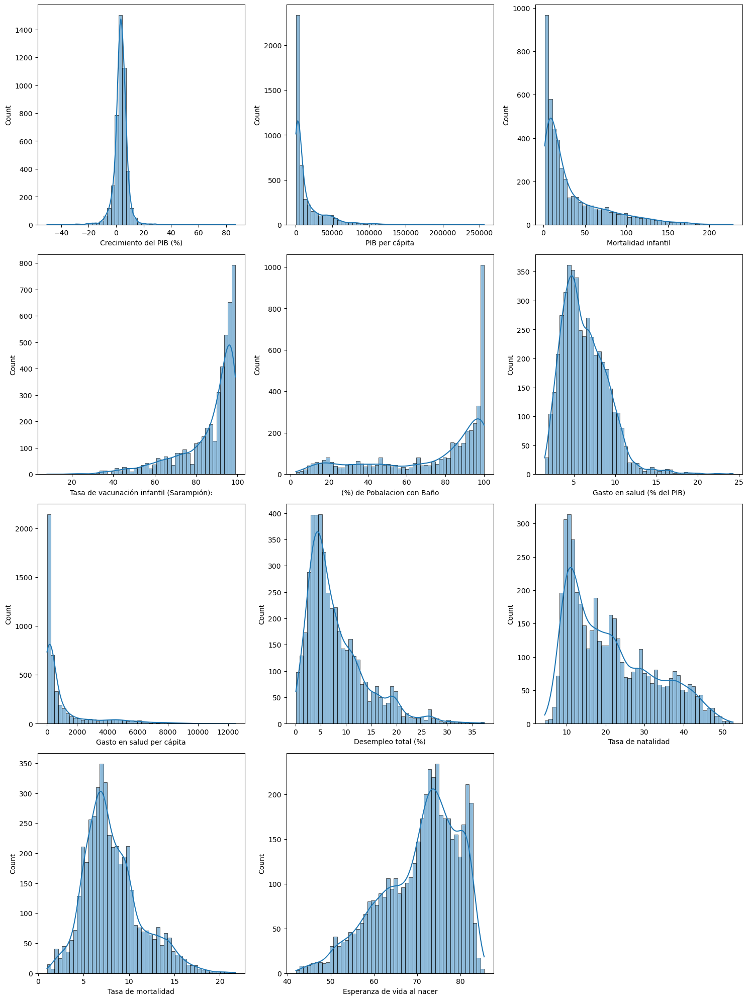

In [180]:
##Importo las librerias seaborn y mathplotlib para trabajar con los histogramas. Importo "Warnings" para eliminar advertencias de futuras actualizaciones.
import seaborn as sns
import matplotlib.pyplot as plt
import math
import warnings

# Elimino la advertencias de tipo FutureWarning
warnings.simplefilter(action='ignore', category=FutureWarning)

variables = ['Crecimiento del PIB (%)', 'PIB per cápita', 'Mortalidad infantil', 'Tasa de vacunación infantil (Sarampión):','(%) de Pobalacion con Baño', 
             'Gasto en salud (% del PIB)', 'Gasto en salud per cápita','Desempleo total (%)','Tasa de natalidad','Tasa de mortalidad','Esperanza de vida al nacer']

num_vars = len(variables)
rows = math.ceil(num_vars / 3)  # Calcula filas necesarias
cols = min(3, num_vars)  # Máximo 3 columnas

plt.figure(figsize=(15, 5 * rows))
for i, var in enumerate(variables, 1):
    plt.subplot(rows, cols, i)
    sns.histplot(df_imputed[var], kde=True, bins=50)

plt.tight_layout()
plt.show()

In [181]:
#Analizo la cantidad de NaN que exitesn en el dataframe.
df_pivot.isnull().sum()

indicador
pais                                          0
anio                                          0
Crecimiento del PIB (%)                     138
PIB per cápita                               82
Mortalidad infantil                         416
Tasa de vacunación infantil (Sarampión):    279
(%) de Pobalacion con Baño                  306
Gasto en salud (% del PIB)                  708
Gasto en salud per cápita                   709
Desempleo total (%)                         503
Tasa de natalidad                           254
Tasa de mortalidad                          259
Esperanza de vida al nacer                  328
dtype: int64

In [182]:
df_pivot.dtypes

indicador
pais                                         object
anio                                          int64
Crecimiento del PIB (%)                     float64
PIB per cápita                              float64
Mortalidad infantil                         float64
Tasa de vacunación infantil (Sarampión):    float64
(%) de Pobalacion con Baño                  float64
Gasto en salud (% del PIB)                  float64
Gasto en salud per cápita                   float64
Desempleo total (%)                         float64
Tasa de natalidad                           float64
Tasa de mortalidad                          float64
Esperanza de vida al nacer                  float64
dtype: object

## Completar los valores NaN del dataset:

### Existen dos situaciones que se precentan en el dataset.

#### 1- Paises con indicadores que tienen algunos datos faltantes.
#### 2- Paises con Indicadores que tienen ausencia total de datos.

### Se decide trabajar el proceso de rellenedo en dos partes. 

#### Paso 1: Rellenar NaN con la Mediana del País
#### Se agrupa por país.
Lo indiciadores presentan una distribución asimétrica de los datos (salgo Crecimiento PBI) por lo que se selecciona la Mediana para evitar mayores errores.
Para cada indicador, si al menos hay un valor disponible en ese país, se rellenan los NaN con la mediana del mismo país.
Esto evita que KNN rellene valores que podrían completarse con datos internos del país.
#### Paso 2: Aplicar para Países con Indicadores Completamente Vacíos
Si un país tiene un indicador con todos los valores en NaN, la mediana no lo puede completar.
Se usa KNNImputer para estimar los valores comparándolo con países similares.
KNN busca los países más parecidos y rellena los valores faltantes en función de ellos

In [183]:
# Agrupo por pais y se rellenan NaN con la Mediana de cada país por indicador
df_median = df_pivot.copy()
for columna in df_pivot.columns[2:]:  # Ignorar "País" y "Año"
    df_median[columna] = df_pivot.groupby("pais")[columna].transform(lambda x: x.fillna(x.median()))

# Aplicar KNNImputer para mejorar la imputación de los valores restantes
imputer = KNNImputer(n_neighbors=3)  # Usa los 3 países más similares
df_imputed = df_median.copy()
df_imputed.iloc[:, 2:] = imputer.fit_transform(df_median.iloc[:, 2:])  # Imputamos solo indicadores numéricos

# 🔹 Mostrar resultado final
df_imputed.head(30)

indicador,pais,anio,Crecimiento del PIB (%),PIB per cápita,Mortalidad infantil,Tasa de vacunación infantil (Sarampión):,(%) de Pobalacion con Baño,Gasto en salud (% del PIB),Gasto en salud per cápita,Desempleo total (%),Tasa de natalidad,Tasa de mortalidad,Esperanza de vida al nacer
0,AFG,2000,2.724543,174.930991,131.6,27.0,20.970919,9.926482,52.488295,7.935,49.664,12.096,55.298
1,AFG,2001,-9.431974,138.706822,127.4,37.0,20.982349,9.926482,52.488295,7.953,48.979,11.713,55.798
2,AFG,2002,28.600001,178.954088,123.0,35.0,22.541339,9.443391,17.007586,7.930,48.201,11.280,56.454
3,AFG,2003,8.832278,198.871116,118.5,39.0,24.100333,8.941258,17.814924,7.880,47.350,10.698,57.344
4,AFG,2004,1.414118,221.763654,114.0,48.0,25.666240,9.808474,21.429464,7.899,46.330,10.277,57.944
5,AFG,2005,11.229715,254.184249,109.5,50.0,27.239189,9.948289,25.107073,7.885,45.263,9.941,58.361
6,AFG,2006,5.357403,274.218554,105.0,53.0,28.812266,10.622766,28.919823,7.914,44.721,9.679,58.684
7,AFG,2007,13.826320,376.223152,100.6,55.0,30.466534,9.904675,32.717205,7.817,43.858,9.359,59.111
8,AFG,2008,3.924984,381.733238,96.3,59.0,32.128705,10.256495,39.969898,7.878,41.506,8.832,59.852
9,AFG,2009,21.390528,452.053705,92.3,60.0,33.798958,9.818487,43.260769,7.754,41.157,8.535,60.364


In [184]:
#Verificamos la ausencia de NaN.
df_imputed.isnull().sum()

indicador
pais                                        0
anio                                        0
Crecimiento del PIB (%)                     0
PIB per cápita                              0
Mortalidad infantil                         0
Tasa de vacunación infantil (Sarampión):    0
(%) de Pobalacion con Baño                  0
Gasto en salud (% del PIB)                  0
Gasto en salud per cápita                   0
Desempleo total (%)                         0
Tasa de natalidad                           0
Tasa de mortalidad                          0
Esperanza de vida al nacer                  0
dtype: int64

In [188]:
import pandas as pd

# Suponiendo que tu DataFrame se llama df

# Índices de Desarrollo Humano
df_imputed["Indice_Salud"] = (df_imputed["Gasto en salud per cápita"] / df_imputed["PIB per cápita"]) * 100  # Relación entre gasto en salud y PIB per cápita

df_imputed["Indice_Bienestar"] = (df_imputed["Esperanza de vida al nacer"] / df_imputed["Mortalidad infantil"]) * 100  # Relación entre esperanza de vida y mortalidad infantil

df_imputed["Indice_Calidad_Vida"] = (df_imputed["Tasa de vacunación infantil (Sarampión):"] + df_imputed["(%) de Pobalacion con Baño"]) / 2  # Promedio de vacunación y acceso a saneamiento

# Factores Económicos
df_imputed["PIB_Ajustado_Salud"] = (df_imputed["PIB per cápita"] * df_imputed["Gasto en salud (% del PIB)"]) / 100  # PIB per cápita ponderado por gasto en salud

df_imputed["PIB_Ajustado_Desempleo"] = df_imputed["PIB per cápita"] * (1 - df_imputed["Desempleo total (%)"]/100)  # PIB ajustado por tasa de desempleo

df_imputed["Desempleo_Ajustado_Natalidad"] = df_imputed["Desempleo total (%)"] / df_imputed["Tasa de natalidad"]  # Relación entre desempleo y natalidad

# Factores Demográficos
df_imputed["Relacion_Natalidad_Mortalidad"] = df_imputed["Tasa de natalidad"] / df_imputed["Tasa de mortalidad"]  # Relación entre natalidad y mortalidad

df_imputed["Mortalidad_Infantil_Ajustada"] = (df_imputed["Mortalidad infantil"] / df_imputed["Esperanza de vida al nacer"]) * 100  # Mortalidad infantil en proporción a la esperanza de vida

# Relaciones Epidemiológicas
df_imputed["Impacto_Vacunacion_Mortalidad"] = df_imputed["Mortalidad infantil"] / df_imputed["Tasa de vacunación infantil (Sarampión):"]  # Impacto de la vacunación en la mortalidad infantil

df_imputed["Impacto_Saneamiento_Esperanza_Vida"] = df_imputed["Esperanza de vida al nacer"] / df_imputed["(%) de Pobalacion con Baño"]  # Relación entre acceso a saneamiento y esperanza de vida

# Mostrar las primeras filas del DataFrame con las nuevas columnas
df_imputed.head()


indicador,pais,anio,Crecimiento del PIB (%),PIB per cápita,Mortalidad infantil,Tasa de vacunación infantil (Sarampión):,(%) de Pobalacion con Baño,Gasto en salud (% del PIB),Gasto en salud per cápita,Desempleo total (%),...,Indice_Salud,Indice_Bienestar,Indice_Calidad_Vida,PIB_Ajustado_Salud,PIB_Ajustado_Desempleo,Desempleo_Ajustado_Natalidad,Relacion_Natalidad_Mortalidad,Mortalidad_Infantil_Ajustada,Impacto_Vacunacion_Mortalidad,Impacto_Saneamiento_Esperanza_Vida
0,AFG,2000,2.724543,174.930991,131.6,27.0,20.970919,9.926482,52.488295,7.935,...,30.005143,42.019757,23.985460,17.364493,161.050217,0.159774,4.105820,237.983291,4.874074,2.636890
1,AFG,2001,-9.431974,138.706822,127.4,37.0,20.982349,9.926482,52.488295,7.953,...,37.841178,43.797488,28.991174,13.768707,127.675468,0.162376,4.181593,228.323596,3.443243,2.659283
2,AFG,2002,28.600001,178.954088,123.0,35.0,22.541339,9.443391,17.007586,7.930,...,9.503882,45.897561,28.770669,16.899334,164.763029,0.164519,4.273138,217.876501,3.514286,2.504465
3,AFG,2003,8.832278,198.871116,118.5,39.0,24.100333,8.941258,17.814924,7.880,...,8.958025,48.391561,31.550166,17.781580,183.200072,0.166420,4.426061,206.647600,3.038462,2.379386
4,AFG,2004,1.414118,221.763654,114.0,48.0,25.666240,9.808474,21.429464,7.899,...,9.663200,50.828070,36.833120,21.751629,204.246543,0.170494,4.508125,196.741682,2.375000,2.257596


### 📊 Combinaciones de Variables para Mejorar el Modelo
### 1️⃣ Índices de Desarrollo Humano
### Índice de Salud: (Gasto en salud per cápita / PIB per cápita) * 100
### Índice de Bienestar: (Esperanza de vida al nacer / Tasa de mortalidad infantil) * 100
### Índice de Calidad de Vida: ((Tasa de vacunación infantil + (%) de Población con Baño) / 2)
### 2️⃣ Factores Económicos
### PIB ajustado por salud: (PIB per cápita * Gasto en salud (% del PIB)) / 100
### PIB ajustado por desempleo: (PIB per cápita * (1 - Desempleo total (%)))
### Desempleo ajustado por natalidad: Desempleo total (%) / Tasa de natalidad
###  3️⃣ Factores Demográficos
### Relación Natalidad/Mortalidad: Tasa de natalidad / Tasa de mortalidad
### Mortalidad infantil ajustada: (Mortalidad infantil / Esperanza de vida al nacer) * 100
### 4️⃣ Relaciones Epidemiológicas
### Impacto de la vacunación en la mortalidad infantil: Mortalidad infantil / Tasa de vacunación infantil
### Impacto del acceso a saneamiento en la esperanza de vida: Esperanza de vida al nacer / (%) de Población con Baño

# INSIGHTS

## Insight #1
### Analizamos la esperanza de vida a lo largo de los años entre paises para ver como evolucionó.

#### Podemos ver que independientemente del pais, en el año 2020 la esperanza de vida bajo sustancialmente por la pandemia de COVID.

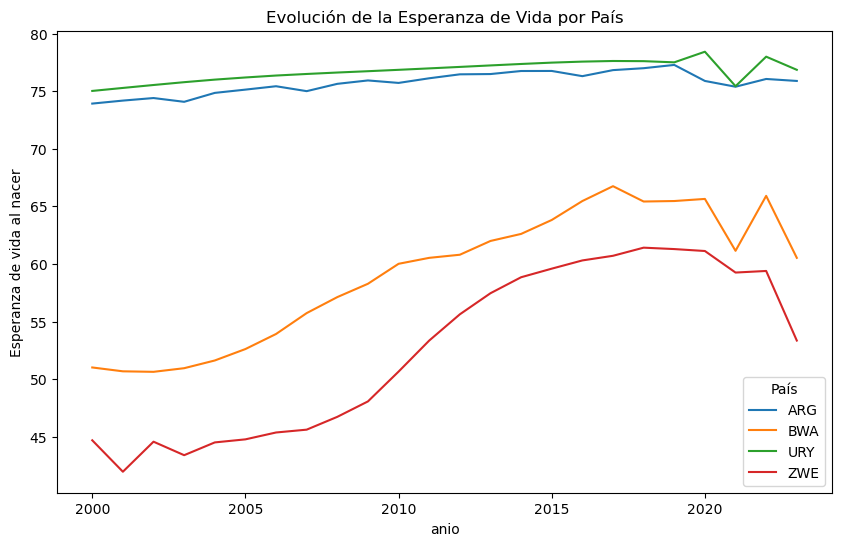

In [143]:
plt.figure(figsize=(10, 6))
sns.lineplot(data=df_imputed[df_imputed['pais'].isin(['BWA', 'ARG','URY','ZWE'])], x="anio", y="Esperanza de vida al nacer", hue="pais")
#sns.lineplot(data=df_pivot[df_pivot['pais'].isin(['CUB', 'NOR'])], x="anio", y="Crecimiento del PIB (%)", hue="pais")
plt.title("Evolución de la Esperanza de Vida por País")
plt.legend(title="País")
plt.show()

## Insight #2
### Se puede observar que en los pasies con mayor tasa de Natalidad y mayor tasa de mortalidad son los que tienen menor esperanza de vida.
### Los casos particulares pueden estar dados por guerras o enfermedades.

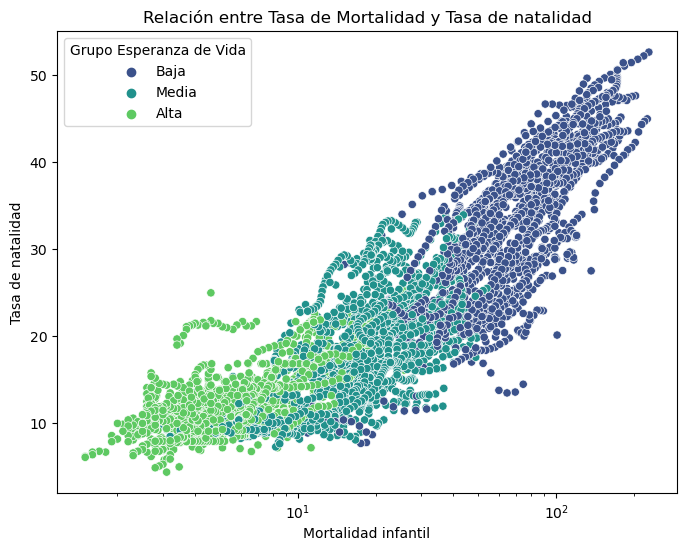

In [146]:
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
df_pivot= df_imputed
# Crear categorías de Tasa de natalidad en 3 grupos
df_imputed["Grupo Natalidad"] = pd.qcut(df_imputed["Tasa de natalidad"], q=3, labels=["Baja", "Media", "Alta"])
df_imputed["Grupo Esperanza de Vida"] = pd.qcut(df_imputed["Esperanza de vida al nacer"], q=3, labels=["Baja", "Media", "Alta"])
df_imputed["Grupo PIB per cápita"] = pd.qcut(df_imputed["PIB per cápita"], q=3, labels=["Baja", "Media", "Alta"])
# Graficar con color según el grupo de natalidad
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df_imputed, x="Mortalidad infantil", y="Tasa de natalidad", hue="Grupo Esperanza de Vida", palette="viridis")

plt.xscale("log")
plt.title("Relación entre Tasa de Mortalidad y Tasa de natalidad")
plt.show()


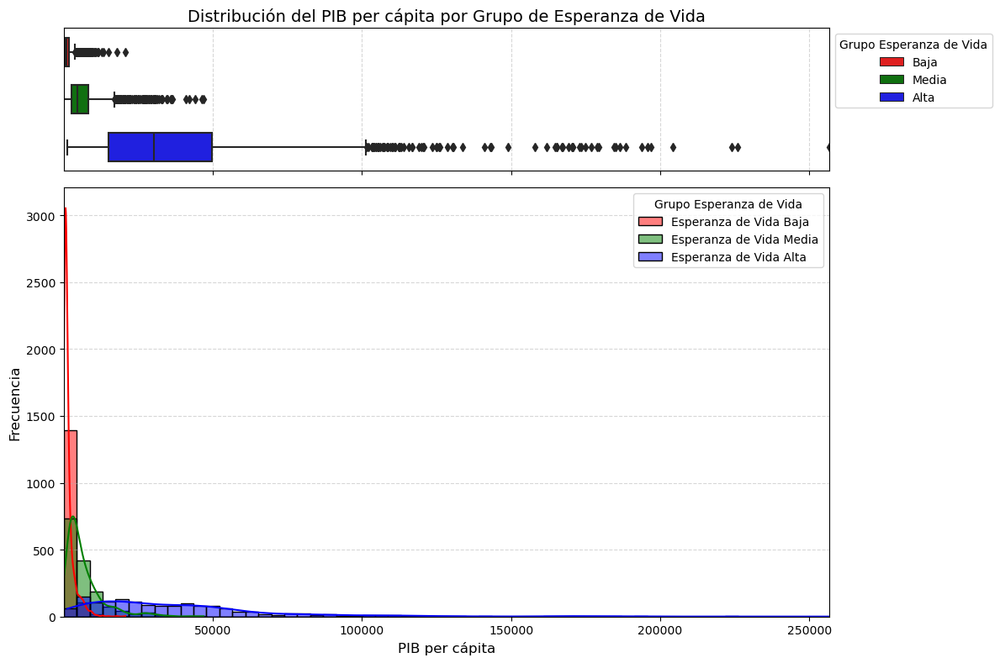

In [173]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Crear la figura y los ejes
fig, (ax_box, ax_hist) = plt.subplots(2, 1, figsize=(12, 8), sharex=True, gridspec_kw={'height_ratios': [1, 3]})

# Colores por grupo
colors = {'Baja': 'red', 'Media': 'green', 'Alta': 'blue'}

# Boxplot
sns.boxplot(data=df_imputed, x='PIB per cápita', y='Grupo Esperanza de Vida', hue='Grupo Esperanza de Vida', 
            palette=colors, ax=ax_box, dodge=False, width=0.6)
ax_box.set_xlabel('')
ax_box.set_ylabel('')
ax_box.set(yticks=[])
ax_box.grid(axis='x', linestyle='--', alpha=0.5)
ax_box.set_title('Distribución del PIB per cápita por Grupo de Esperanza de Vida', fontsize=14)
ax_box.legend(title='Grupo Esperanza de Vida', loc='upper left', bbox_to_anchor=(1, 1))

# Definir bins adecuados basados en los datos
min_value = df_imputed['PIB per cápita'].min()
max_value = df_imputed['PIB per cápita'].max()
bins = np.linspace(min_value, max_value, 60)  # Se generan 30 bins equidistantes

# Histogramas con mejor escala y bins
for grupo, color in colors.items():
    sns.histplot(data=df_imputed[df_imputed['Grupo Esperanza de Vida'] == grupo], 
                 x='PIB per cápita', color=color, label=f'Esperanza de Vida {grupo}', 
                 kde=True, ax=ax_hist, alpha=0.5, bins=bins)

# Ajustes del eje X
ax_hist.set_xlim(min_value, max_value)  # Limita la escala para evitar espacios innecesarios
ax_hist.set_xlabel('PIB per cápita', fontsize=12)
ax_hist.set_ylabel('Frecuencia', fontsize=12)
ax_hist.legend(title='Grupo Esperanza de Vida', loc='upper right')
ax_hist.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()

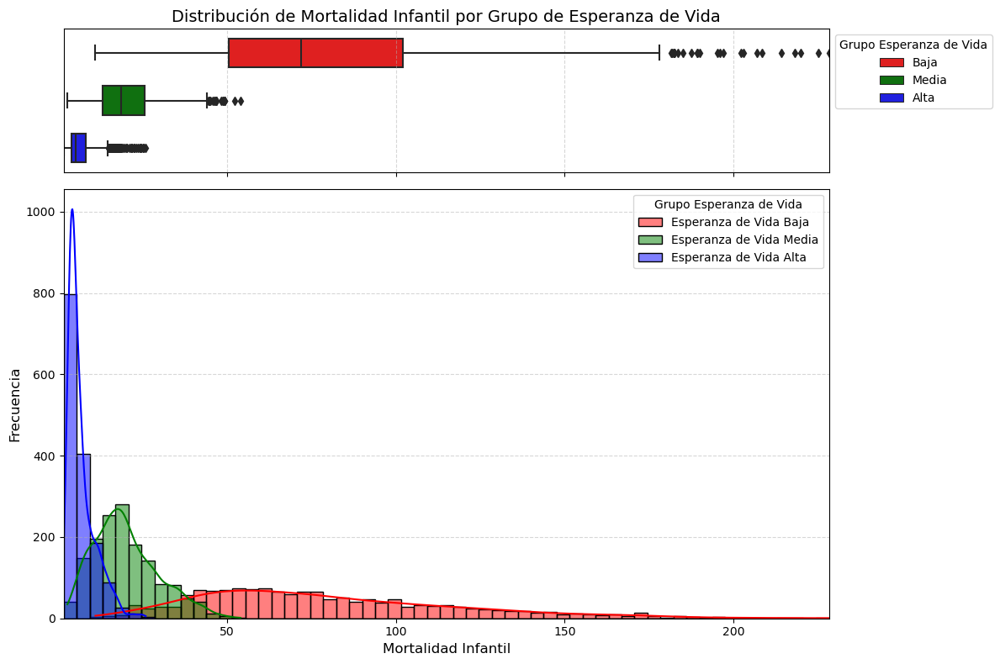

In [174]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

# Crear la figura y los ejes
fig, (ax_box, ax_hist) = plt.subplots(2, 1, figsize=(12, 8), sharex=True, gridspec_kw={'height_ratios': [1, 3]})

# Colores por grupo
colors = {'Baja': 'red', 'Media': 'green', 'Alta': 'blue'}

# Boxplot
sns.boxplot(data=df_imputed, x='Mortalidad infantil', y='Grupo Esperanza de Vida', hue='Grupo Esperanza de Vida', 
            palette=colors, ax=ax_box, dodge=False, width=0.6)
ax_box.set_xlabel('')
ax_box.set_ylabel('')
ax_box.set(yticks=[])
ax_box.grid(axis='x', linestyle='--', alpha=0.5)
ax_box.set_title('Distribución de Mortalidad Infantil por Grupo de Esperanza de Vida', fontsize=14)
ax_box.legend(title='Grupo Esperanza de Vida', loc='upper left', bbox_to_anchor=(1, 1))

# Definir bins adecuados basados en los datos
min_value = df_imputed['Mortalidad infantil'].min()
max_value = df_imputed['Mortalidad infantil'].max()
bins = np.linspace(min_value, max_value, 60)  # Se generan 30 bins equidistantes

# Histogramas con mejor escala y bins
for grupo, color in colors.items():
    sns.histplot(data=df_imputed[df_imputed['Grupo Esperanza de Vida'] == grupo], 
                 x='Mortalidad infantil', color=color, label=f'Esperanza de Vida {grupo}', 
                 kde=True, ax=ax_hist, alpha=0.5, bins=bins)

# Ajustes del eje X
ax_hist.set_xlim(min_value, max_value)  # Limita la escala para evitar espacios innecesarios
ax_hist.set_xlabel('Mortalidad Infantil', fontsize=12)
ax_hist.set_ylabel('Frecuencia', fontsize=12)
ax_hist.legend(title='Grupo Esperanza de Vida', loc='upper right')
ax_hist.grid(axis='y', linestyle='--', alpha=0.5)

plt.tight_layout()
plt.show()


## Insight #3
### Se puede observar que en los pasies con mayor PBI per cápita tienen un menor cantidad de mortalidada infaltil y una esperanza de vida mayor 
### Esto se debe a que tienen mayores recursas para brindar un mejor sistema de salud a su población.

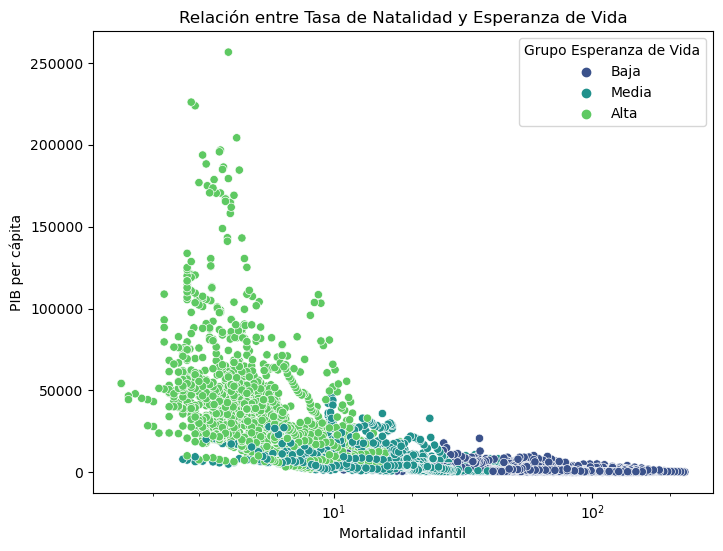

In [147]:
# Crear categorías de Tasa de natalidad en 3 grupos
#df_pivot["Grupo Natalidad"] = pd.qcut(df_pivot["Tasa de natalidad"], q=3, labels=["Baja", "Media", "Alta"])
#df_pivot["Grupo Esperanza de Vida"] = pd.qcut(df_pivot["Esperanza de vida al nacer"], q=3, labels=["Baja", "Media", "Alta"])
# Graficar con color según el grupo de natalidad
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df_imputed, x="Mortalidad infantil", y="PIB per cápita", hue="Grupo Esperanza de Vida", palette="viridis")

plt.xscale("log")
plt.title("Relación entre Tasa de Natalidad y Esperanza de Vida")
plt.show()


## Insight #4
### Los Paises con una tasa de natalidad y mortalidad baja tiene mayor esperanza de vida. 
### Es un fenómeno de los paises más desarrollados, donde estan teniendo un problema de muy baja natalidad como sucede en los paises Europeos y Japón.

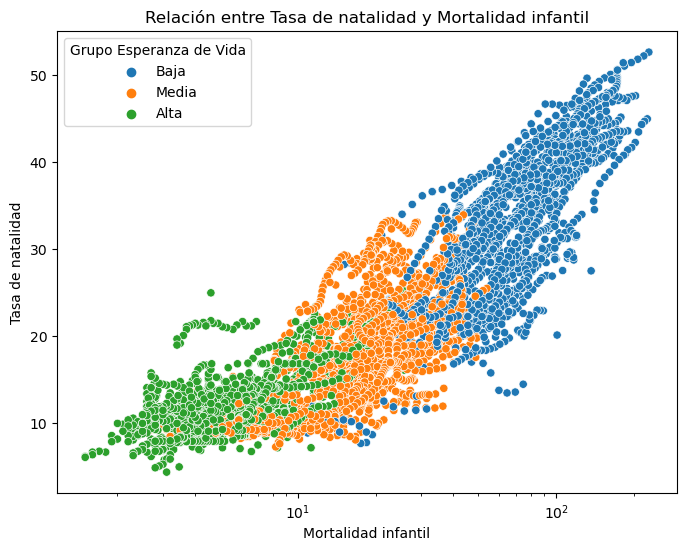

In [148]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df_imputed, x="Mortalidad infantil", y="Tasa de natalidad", hue="Grupo Esperanza de Vida")
plt.xscale("log")  
plt.title("Relación entre Tasa de natalidad y Mortalidad infantil")
plt.show()

## Insight #5
### Para confirmar el insight 4 se comparan los Paises con una tasa de natalidad y mortalidad baja tiene mayor PBI per capita. 
### Es un fenómeno de los paises más desarrollados, donde estan teniendo un problema de muy baja natalidad como sucede en los paises Europeos y Japón.

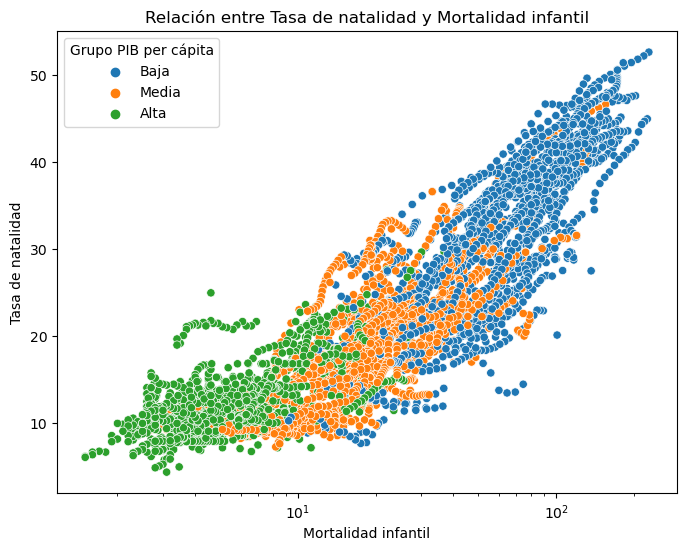

In [149]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df_imputed, x="Mortalidad infantil", y="Tasa de natalidad", hue="Grupo PIB per cápita")
plt.xscale("log")  
plt.title("Relación entre Tasa de natalidad y Mortalidad infantil")
plt.show()

## Insight #6
### Relación entre la esperanza de vida al nacer y el PBI per capita separadas por esperanza de vida Baja-Media-Alta.

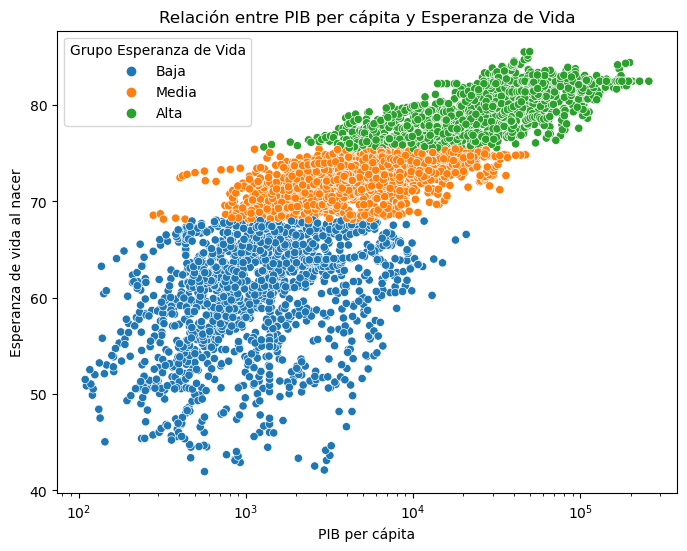

In [88]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df_imputed, x="PIB per cápita", y="Esperanza de vida al nacer",hue="Grupo Esperanza de Vida")
plt.xscale("log")  
plt.title("Relación entre PIB per cápita y Esperanza de Vida")
plt.show()

## Insight #7
### Países con alta mortalidad infantil tienen menor esperanza de vida.


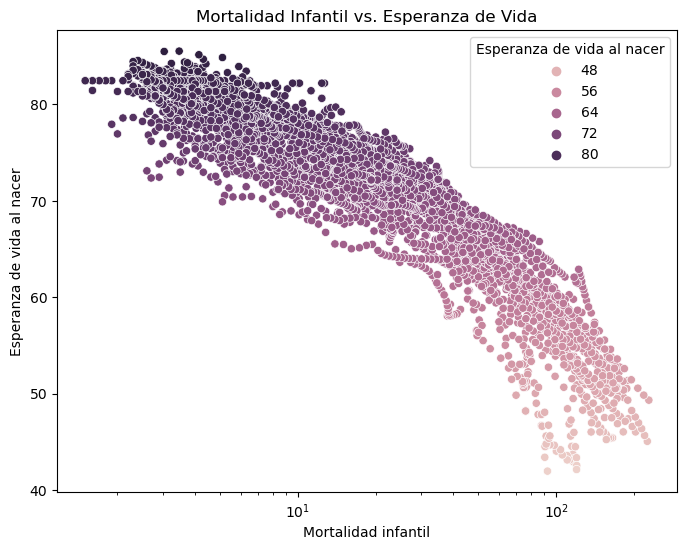

In [155]:
plt.figure(figsize=(8, 6))
sns.scatterplot(data=df_imputed, x="Mortalidad infantil", y="Esperanza de vida al nacer",hue="Esperanza de vida al nacer")
plt.xscale("log")  
plt.title("Mortalidad Infantil vs. Esperanza de Vida")
plt.show()


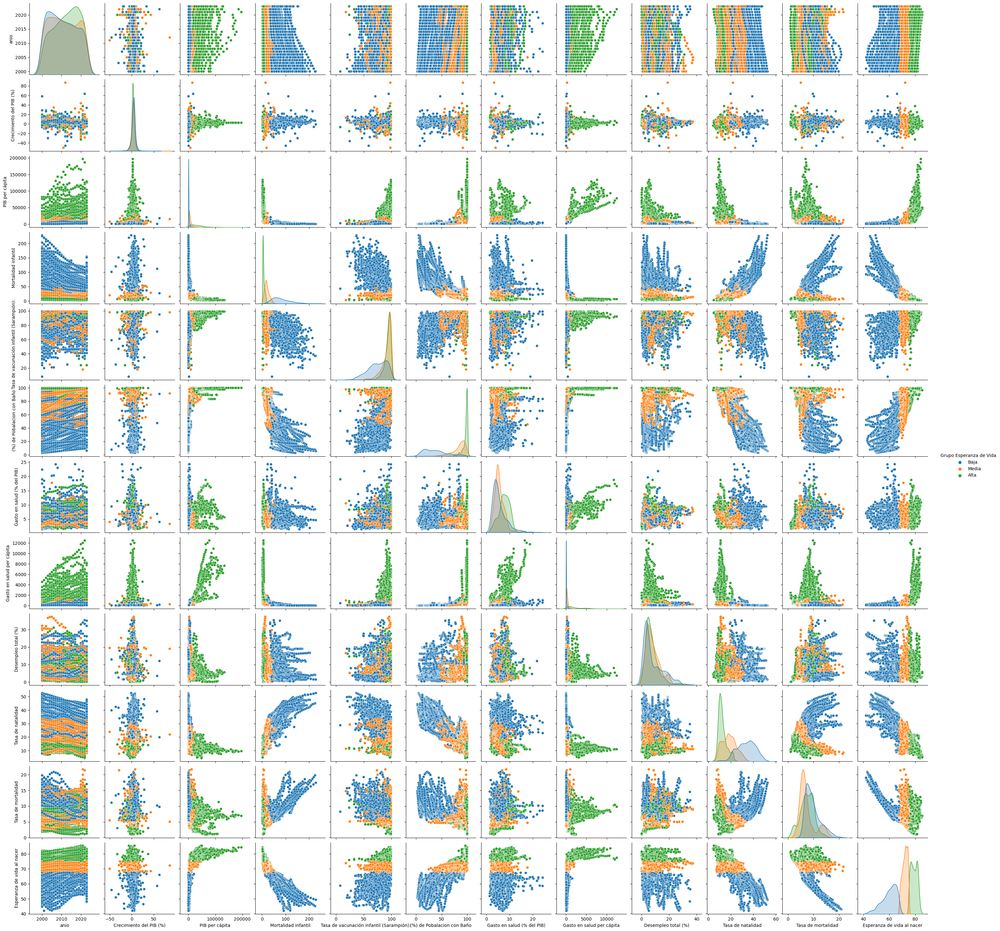

In [44]:
import warnings

# Elimino la advertencias de tipo FutureWarning
warnings.simplefilter(action='ignore', category=FutureWarning)

colores= ["#FF6347","#87CEEB"]  #defino los colores de cada sección del gráfico
sns.pairplot(df_imputed, hue="Grupo Esperanza de Vida", diag_kind='kde')
plt.show()

Se usa una escala logarítmica en el eje del PIB per cápita porque los valores de PIB suelen estar distribuidos de manera altamente sesgada:

1️⃣ Amplio rango de valores: Algunos países tienen un PIB per cápita de unos cientos de dólares, mientras que otros superan los 60,000 USD. Si se usa una escala lineal, los países con PIB más bajo quedarían comprimidos y difíciles de distinguir.

2️⃣ Patrón más claro: La relación entre PIB y esperanza de vida no es lineal. Aumentos pequeños en PIB en países pobres generan grandes mejoras en esperanza de vida, pero en países ricos, un mayor PIB tiene un impacto menor. La escala logarítmica ayuda a visualizar mejor esta tendencia.

3️⃣ Mejor diferenciación de datos: Con una escala lineal, los países con PIB bajo quedarían amontonados a la izquierda del gráfico, sin espacio para distinguir diferencias. Al usar logaritmo, se expanden las diferencias en la parte baja del PIB y se comprimen en la parte alta.

🔹 Conclusión:
La escala logarítmica permite ver mejor la relación entre PIB y esperanza de vida, resaltando patrones clave y evitando que los datos se amontonen en un extremo del gráfico. 🚀

In [157]:
import pandas as pd
import pycountry

# Función para obtener el nombre del país a partir del código
def get_country_name(code):
    try:
        return pycountry.countries.get(alpha_3=code).name  # Convierte código a nombre
    except AttributeError:
        return None  # Si no encuentra el código, devuelve None

# Cargar DataFrame (suponiendo que la columna de código de país se llama 'pais')
df_imputed["nombre_pais"] = df_imputed["pais"].apply(get_country_name)

# Verificamos si hay valores nulos
print(df_imputed[["pais", "nombre_pais"]].head())


indicador pais  nombre_pais
0          AFG  Afghanistan
1          AFG  Afghanistan
2          AFG  Afghanistan
3          AFG  Afghanistan
4          AFG  Afghanistan


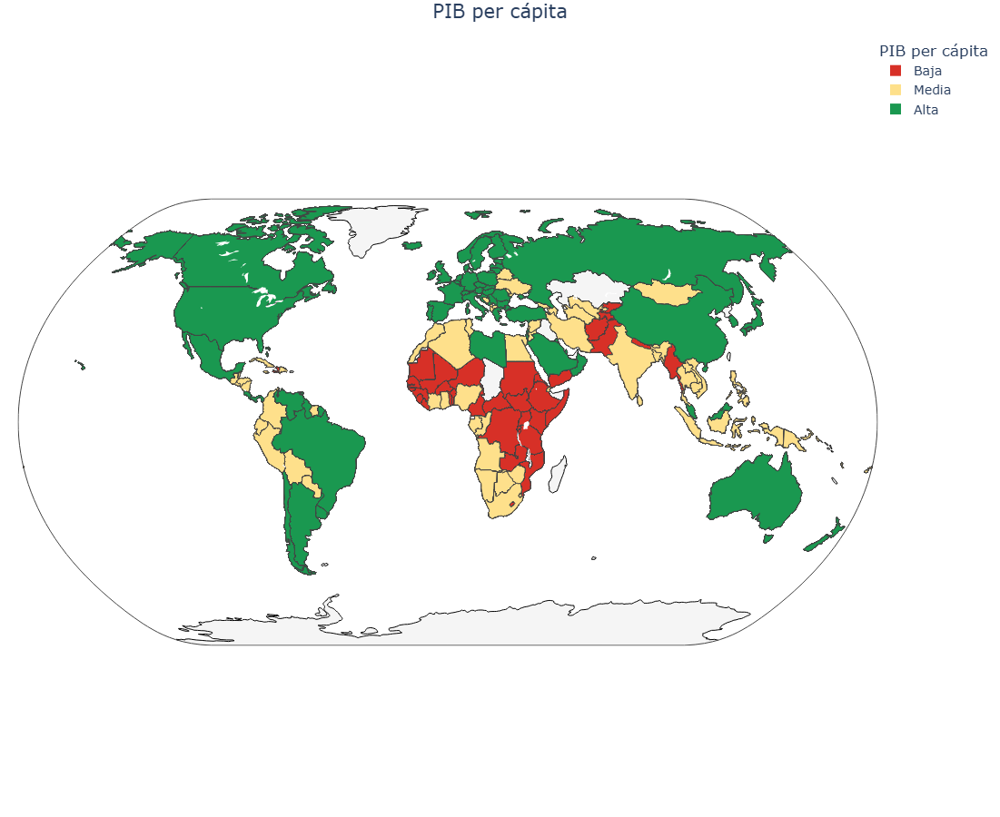

In [161]:
import pandas as pd
import plotly.express as px
import pycountry

# Función para obtener código ISO alfa-3 a partir del nombre del país
def get_iso3(name):
    try:
        return pycountry.countries.lookup(name).alpha_3
    except LookupError:
        return None

# Asegurar que df_pivot tenga una columna con códigos ISO-3
df_imputed["iso_alpha"] = df_imputed["nombre_pais"].apply(get_iso3)   

"""# Dividir esperanza de vida en tercios sin solapamiento
df_imputed["Categoria_Esperanza"] = pd.qcut(
    df_imputed["Esperanza de vida al nacer"],
    q=3,  # Divide en tres partes iguales
    labels=["Baja", "Media", "Alta"]
)"""

# Crear el mapa coroplético con Plotly Express
fig = px.choropleth(
    df_imputed,
    locations="iso_alpha",  # Usa códigos ISO-3 en lugar de nombres
    locationmode="ISO-3",
    color="Grupo PIB per cápita",
    color_discrete_map={
        "Baja": "#d73027",   # Rojo oscuro
        "Media": "#fee08b",  # Amarillo claro
        "Alta": "#1a9850"    # Verde fuerte
    },
    title="PIB per cápita",
    projection="natural earth",
    height=900,
    width=1400
)

# Mejorar la apariencia del mapa
fig.update_geos(
    showcoastlines=True,
    coastlinecolor="black",
    showland=True,
    landcolor="whitesmoke"
)

# 🔹 Corregir la leyenda y mejorar visibilidad
fig.update_layout(
    title_x=0.5,  # Centrar título
    font=dict(size=15),
    margin=dict(l=20, r=10, t=40, b=10),  # Ajustar márgenes para mejor visualización
    legend_title_text="PIB per cápita",  # Título de la leyenda
    legend=dict(
        x=1, y=1,  # Posición: arriba a la derecha
        traceorder="normal",
        font=dict(size=14)  # Tamaño del texto en la leyenda
    )
)

fig.show()

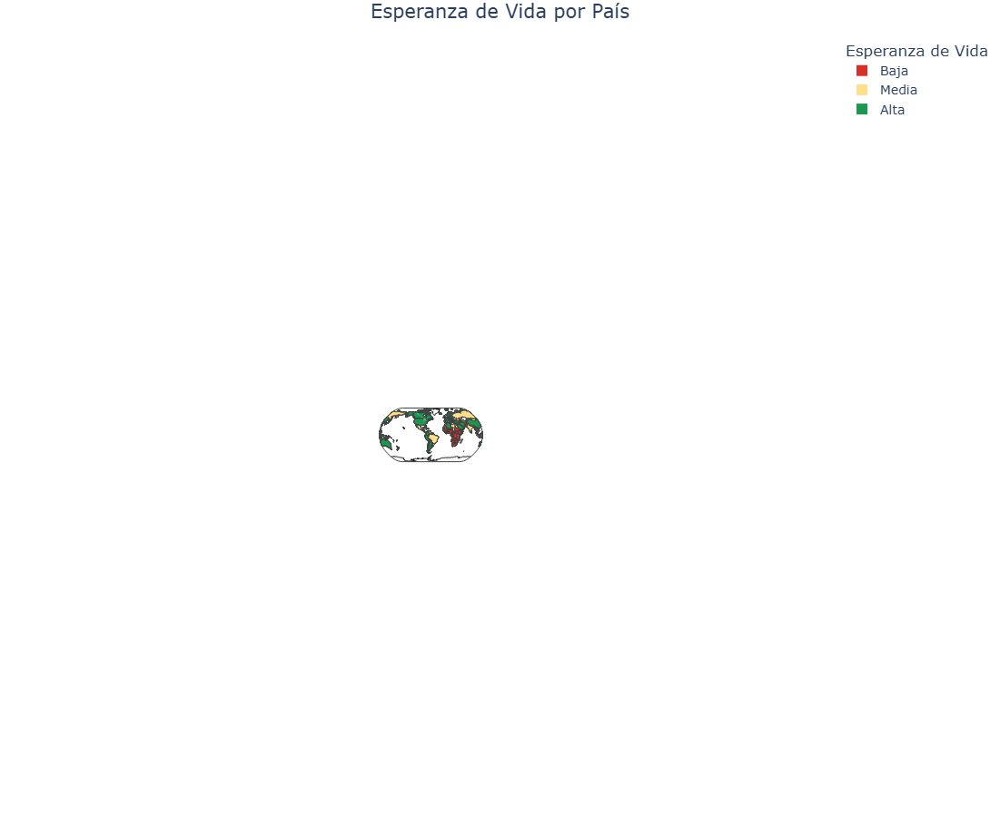

In [158]:
import pandas as pd
import plotly.express as px
import pycountry

# Función para obtener código ISO alfa-3 a partir del nombre del país
def get_iso3(name):
    try:
        return pycountry.countries.lookup(name).alpha_3
    except LookupError:
        return None

# Asegurar que df_pivot tenga una columna con códigos ISO-3
df_imputed["iso_alpha"] = df_imputed["nombre_pais"].apply(get_iso3)   

# Dividir esperanza de vida en tercios sin solapamiento
df_imputed["Categoria_Esperanza"] = pd.qcut(
    df_imputed["Esperanza de vida al nacer"],
    q=3,  # Divide en tres partes iguales
    labels=["Baja", "Media", "Alta"]
)

# Crear el mapa coroplético con Plotly Express
fig = px.choropleth(
    df_imputed,
    locations="iso_alpha",  # Usa códigos ISO-3 en lugar de nombres
    locationmode="ISO-3",
    color="Categoria_Esperanza",
    color_discrete_map={
        "Baja": "#d73027",   # Rojo oscuro
        "Media": "#fee08b",  # Amarillo claro
        "Alta": "#1a9850"    # Verde fuerte
    },
    title="Esperanza de Vida por País",
    projection="natural earth",
    height=900,
    width=1400
)

# Mejorar la apariencia del mapa
fig.update_geos(
    showcoastlines=True,
    coastlinecolor="black",
    showland=True,
    landcolor="whitesmoke"
)

# 🔹 Corregir la leyenda y mejorar visibilidad
fig.update_layout(
    title_x=0.5,  # Centrar título
    font=dict(size=15),
    margin=dict(l=20, r=10, t=40, b=10),  # Ajustar márgenes para mejor visualización
    legend_title_text="Esperanza de Vida",  # Título de la leyenda
    legend=dict(
        x=1, y=1,  # Posición: arriba a la derecha
        traceorder="normal",
        font=dict(size=14)  # Tamaño del texto en la leyenda
    )
)

fig.show()


🔹 Insights esperados:
✔️ Tendencia positiva → Incremento de esperanza de vida globalmente.
✔️ Descensos en ciertos años → Guerras, pandemias.

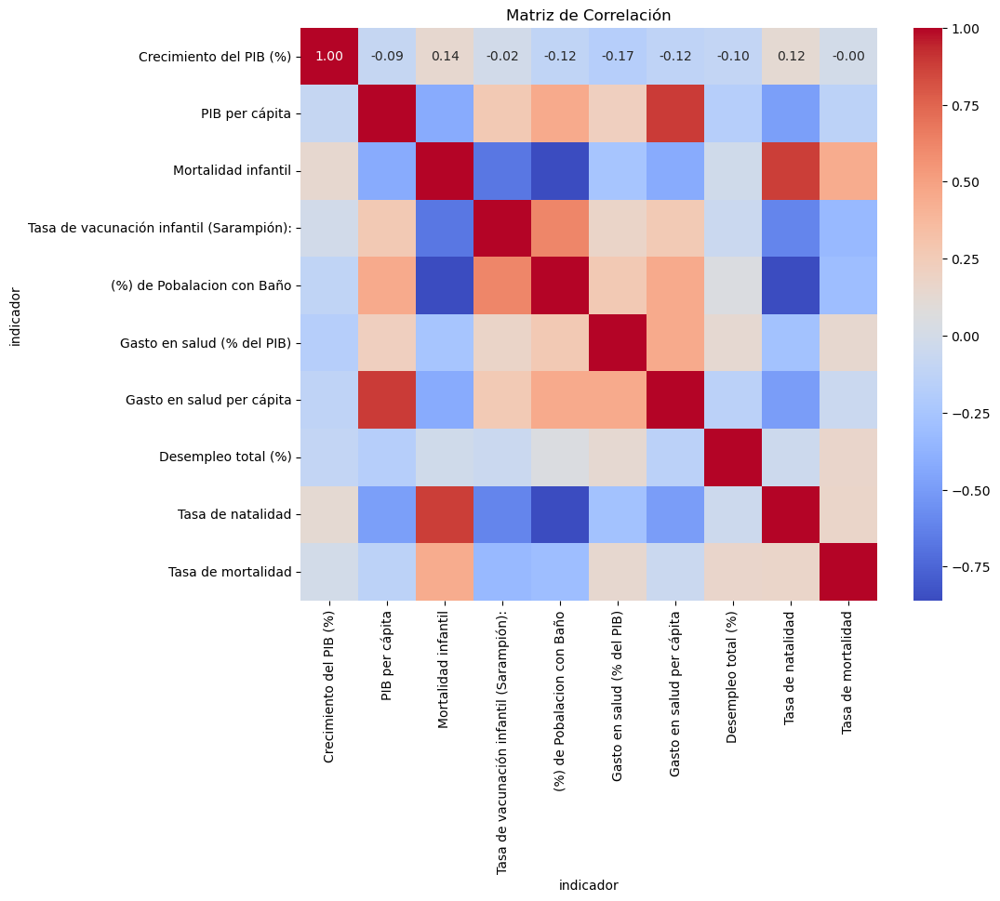

In [79]:
#realizo la matriz de correlación entre variables
plt.figure(figsize=(10, 8))
Solo = df_imputed.drop(['pais','anio','Esperanza de vida al nacer'], axis=1)
correlation_matrix = Solo.corr()
sns.heatmap(correlation_matrix, annot=True, cmap="coolwarm", fmt=".2f")
plt.title("Matriz de Correlación")
plt.show()

paises =  [ "ARG", "BRA", "MEX", "ESP", "DEU", "USA", "CHN", "IND", "COL", "PER", "CHL", "VEN", "FRA", "ITA",
    "GBR", "CAN", "JPN", "AUS", "RUS", "ZAF", "EGY", "IDN", "TUR", "KOR", "SAU", "THA", "UKR", "PAK",
    "IRN", "PHL", "VNM", "NGA", "POL", "NLD", "SWE", "BEL", "CHE", "AUT", "ISR", "NOR", "FIN", "DNK",
    "SGP", "MYS", "NZL", "HKG", "GRC", "HUN", "ROU", "CZE", "PRT", "IRL", "BGR", "SVK",
    "AFG", "ALB", "DZA", "ASM", "AND", "AGO", "ATG", "AZE", "BHS", "BHR", "BGD", "BRB",
    "BLR", "BLZ", "BEN", "BMU", "BTN", "BOL", "BIH", "BWA", "BRN", "BFA", "BDI", "CPV", "KHM",
    "CMR", "CAF", "CYM", "COD", "COG", "COM", "CRI", "CIV", "HRV", "CUB", "CUW", "CYP", "DJI", "DMA",
    "DOM", "ECU", "SLV", "ERI", "EST", "SWZ", "ETH", "FRO", "FJI", "GAB", "GMB", "GEO", "GHA",
    "GIB", "GNB", "GRD", "GTM", "GIN", "GUY", "HTI", "HND", "ISL", "JAM", "JOR", "KEN", "KIR", "KWT",
    "KGZ", "LAO", "LVA", "LBN", "LSO", "LBR", "LBY", "LIE", "LTU", "LUX", "MDV", "MLI", "MLT", "MHL",
    "MRT", "MUS", "FSM", "MDA", "MCO", "MNG", "MNE", "MAR", "MOZ", "MMR", "NAM", "NRU", "NPL", "NIC",
    "NER", "MKD", "MNP", "OMN", "PAN", "PNG", "PRY", "QAT", "SRB", "RWA", "LCA",
    "VCT", "WSM", "SMR", "STP", "SEN", "SYC", "SLE", "SLV", "SOM", "SSD", "LKA", "SDN", "SUR", "SYR",
    "TJK", "TZA", "TLS", "TGO", "TON", "TTO", "TUN", "TKM", "TCA", "TUV", "UGA", "URY", "UZB", "VUT",
    "VIR", "YEM", "ZMB", "ZWE" ] # Lista de países

In [302]:
!pip install geopandas


[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [163]:
import pandas as pd
from sklearn.linear_model import LinearRegression

# 🔹 1. Eliminar columnas categóricas (país y año) y la variable objetivo
data_ = df_pivot.drop(columns=df_imputed.select_dtypes(include=['object']).columns.tolist() + ["Esperanza de vida al nacer"])

# 🔹 2. Calcular VIF manualmente
vif_manual = {}

for feature in data_.columns:
    y = data_[feature]  # Variable dependiente
    X = data_.drop(columns=[feature])  # Variables independientes

    if X.shape[1] == 0:  # Evitar errores si X queda vacío
        continue

    model = LinearRegression().fit(X, y)  # Ajustar modelo de regresión
    r_squared = model.score(X, y)  # Obtener R²

    vif = 1 / (1 - r_squared) if r_squared < 1 else float("inf")  # Evitar división por cero
    vif_manual[feature] = vif

# 🔹 3. Convertir a DataFrame para visualizar mejor
vif_manual_df = pd.DataFrame(list(vif_manual.items()), columns=['Feature', 'VIF'])
print(vif_manual_df)


ValueError: could not convert string to float: 'Alta'

In [214]:
!pip install pycountry


[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip



   ---------------------------------------- 0.0/6.3 MB ? eta -:--:--
   ------------------ --------------------- 2.9/6.3 MB 16.8 MB/s eta 0:00:01
   ---------------------------------------  6.3/6.3 MB 16.8 MB/s eta 0:00:01
   ---------------------------------------- 6.3/6.3 MB 15.0 MB/s eta 0:00:00


In [219]:
!pip install folium


[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [221]:
!pip install geodatasets



[notice] A new release of pip is available: 24.3.1 -> 25.0.1
[notice] To update, run: python.exe -m pip install --upgrade pip
